In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns

In [35]:
import os
files=os.listdir(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets')
for file in files:
    print(file)

other-Lyft_B02510.csv
other-FHV-services_jan-aug-2015.csv
other-Firstclass_B01536.csv
other-Skyline_B00111.csv
uber-raw-data-janjune-15_sample.csv
uber-raw-data-janjune-15.csv
other-American_B01362.csv
uber-raw-data-apr14.csv
Uber-Jan-Feb-FOIL.csv
other-Highclass_B01717.csv
uber-raw-data-aug14.csv
uber-raw-data-sep14.csv
uber-raw-data-jul14.csv
other-Federal_02216.csv
uber-raw-data-jun14.csv
other-Carmel_B00256.csv
other-Diplo_B01196.csv
other-Dial7_B00887.csv
uber-raw-data-may14.csv
other-Prestige_B01338.csv


In [3]:
df=pd.read_csv(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets/uber-raw-data-janjune-15.csv')
df.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [4]:
df.shape

(14270479, 4)

In [5]:
# Removing Duplicate Values
df[df.duplicated()]
df=df.drop_duplicates()
df[df.duplicated()]

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID


In [6]:
df.dtypes
df['Pickup_date']=pd.to_datetime(df['Pickup_date'])
df.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [7]:
# Analyzing whcih month has the highest pickups
df.head()
df['Month']=df['Pickup_date'].dt.month_name()
df['Weekday']=df['Pickup_date'].dt.day_name()
df['Day']=df['Pickup_date'].dt.day
df['Hour']=df['Pickup_date'].dt.hour
df['Minutes']=df['Pickup_date'].dt.minute
df.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,Weekday,Day,Hour,Minutes
0,B02617,2015-05-17 09:47:00,B02617,141,May,Sunday,17,9,47
1,B02617,2015-05-17 09:47:00,B02617,65,May,Sunday,17,9,47
2,B02617,2015-05-17 09:47:00,B02617,100,May,Sunday,17,9,47
3,B02617,2015-05-17 09:47:00,B02774,80,May,Sunday,17,9,47
4,B02617,2015-05-17 09:47:00,B02617,90,May,Sunday,17,9,47


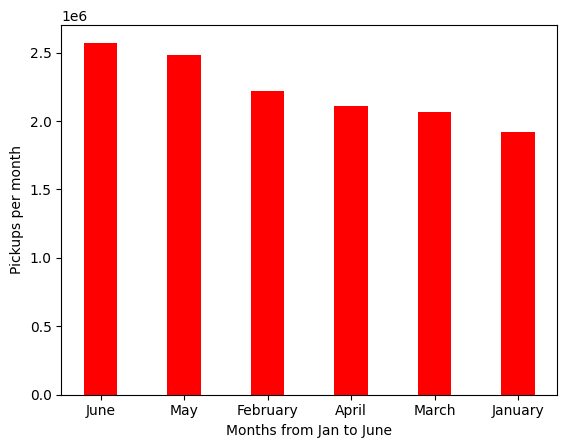

In [8]:
df['Month'].value_counts()
x=df['Month'].value_counts().index
y=df['Month'].value_counts().values
plt.bar(x,y,width=0.4,color='r')
plt.xlabel('Months from Jan to June')
plt.ylabel('Pickups per month')
plt.show()

In [9]:
df2=pd.crosstab(index=df['Month'],columns=df['Weekday'])
df2

Weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
Month,,,,,,,
April,315002,238429,324545,273560,372522,250632,338015
February,373550,274948,368311,296130,335603,287260,286387
January,339285,190606,386049,230487,330319,196574,245650
June,371225,375312,399377,334434,357782,405500,328141
March,309631,269931,314785,313865,277026,320634,256767
May,430134,255501,464298,390391,337607,290004,316045


<Axes: xlabel='Month'>

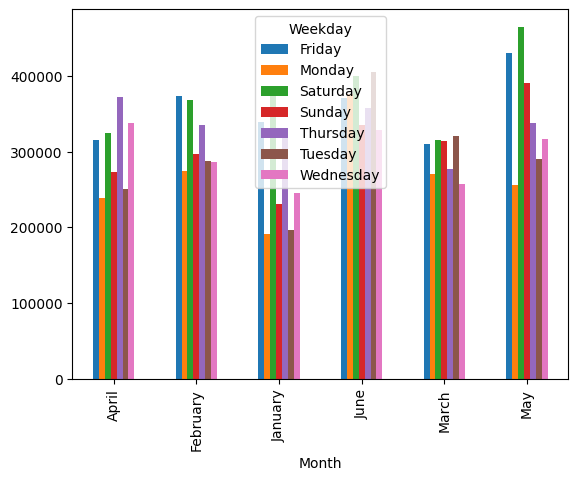

In [10]:
df2.plot(kind='bar')

In [11]:
df.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,Weekday,Day,Hour,Minutes
0,B02617,2015-05-17 09:47:00,B02617,141,May,Sunday,17,9,47
1,B02617,2015-05-17 09:47:00,B02617,65,May,Sunday,17,9,47
2,B02617,2015-05-17 09:47:00,B02617,100,May,Sunday,17,9,47
3,B02617,2015-05-17 09:47:00,B02774,80,May,Sunday,17,9,47
4,B02617,2015-05-17 09:47:00,B02617,90,May,Sunday,17,9,47


In [18]:
# The as_index function makes sure that the groupby labels are used as columns and not as indexes
df3=df.groupby(['Weekday','Hour'],as_index=False).size()
df3

,Weekday,Hour,size
0,Friday,0,79879
1,Friday,1,44563
2,Friday,2,27252
3,Friday,3,19076
4,Friday,4,23049
...,...,...,...
163,Wednesday,19,131317
164,Wednesday,20,123490
165,Wednesday,21,120941
166,Wednesday,22,115208


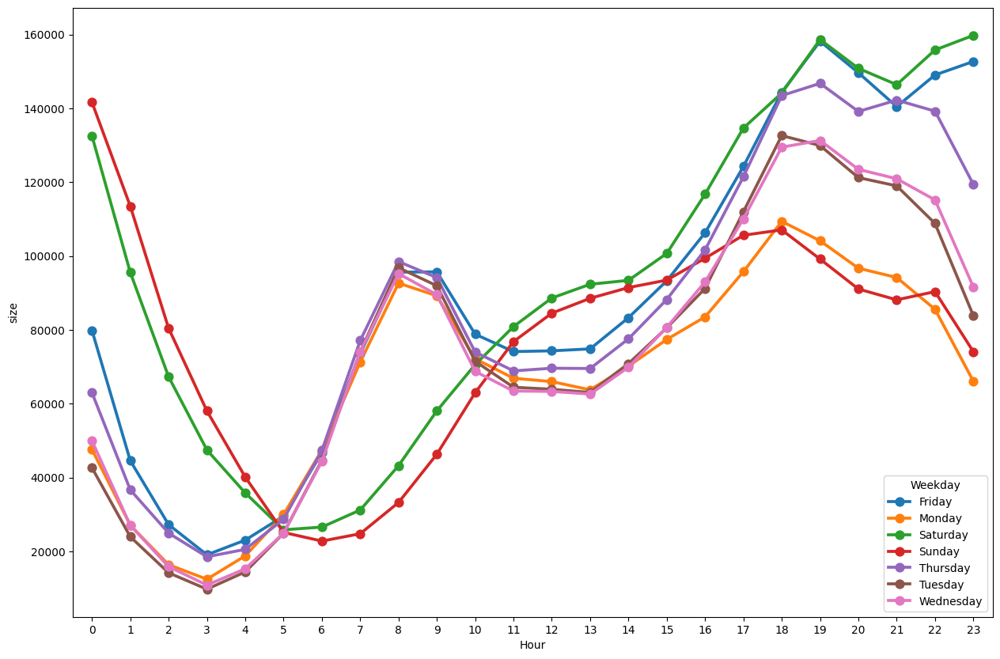

In [19]:
plt.figure(figsize=(15,10))
sns.pointplot(x='Hour',y='size',data=df3,hue='Weekday')
plt.show()

In [20]:
# Which base number has the most number of active vehicles?
df.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,Weekday,Day,Hour,Minutes
0,B02617,2015-05-17 09:47:00,B02617,141,May,Sunday,17,9,47
1,B02617,2015-05-17 09:47:00,B02617,65,May,Sunday,17,9,47
2,B02617,2015-05-17 09:47:00,B02617,100,May,Sunday,17,9,47
3,B02617,2015-05-17 09:47:00,B02774,80,May,Sunday,17,9,47
4,B02617,2015-05-17 09:47:00,B02617,90,May,Sunday,17,9,47


In [21]:
df['Dispatching_base_num'].value_counts()

Dispatching_base_num
B02764    5377732
B02682    3151682
B02617    1973451
B02598    1468261
B02765    1122882
B02512     249808
B02835      26448
B02836       1990
Name: count, dtype: int64

In [22]:
df4=pd.read_csv(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets/Uber-Jan-Feb-FOIL.csv')
df4.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


/var/folders/6b/1hdxxqbn1gx40rtc5xgkfkqc0000gn/T/ipykernel_868/2386228376.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='dispatching_base_number',y='active_vehicles',width=0.2,data=df4,palette='viridis')


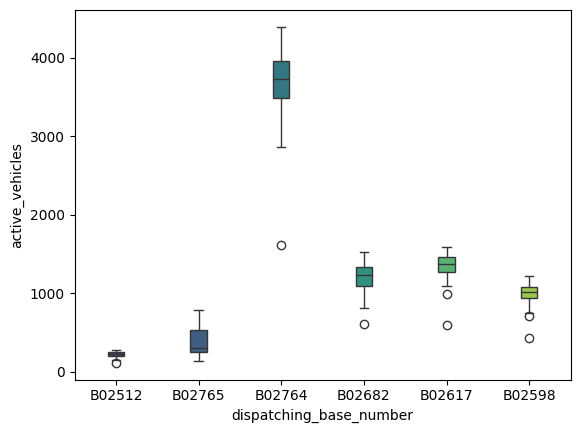

In [25]:
sns.boxplot(x='dispatching_base_number',y='active_vehicles',width=0.2,data=df4,palette='viridis')
plt.show()
# boxplot represents 5-summary stats of data

/var/folders/6b/1hdxxqbn1gx40rtc5xgkfkqc0000gn/T/ipykernel_868/3220899491.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='dispatching_base_number',y='active_vehicles',data=df4,palette='viridis')


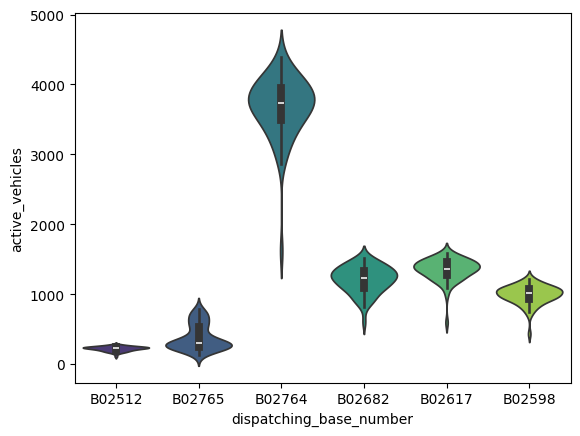

In [26]:
sns.violinplot(x='dispatching_base_number',y='active_vehicles',data=df4,palette='viridis')
plt.show()

In [46]:
# Collecting all the data and merging it
d1=pd.read_csv(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets/uber-raw-data-apr14.csv')
d2=pd.read_csv(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets/uber-raw-data-aug14.csv')
d3=pd.read_csv(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets/uber-raw-data-sep14.csv')
d4=pd.read_csv(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets/uber-raw-data-jul14.csv')
d5=pd.read_csv(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets/uber-raw-data-may14.csv')
d6=pd.read_csv(r'/Users/puravdoshi/Desktop/Data Analysis with Python/Data Analytics Projects/Uber_data_analysis/Uber_datasets/uber-raw-data-jun14.csv')

In [47]:
data_list=[d2,d3,d4,d5,d6]
for data in data_list:
    d1=pd.concat([data,d1])

In [48]:
d1.shape

(4534327, 4)

In [52]:
d1[d1.duplicated()]
d1=d1.drop_duplicates()
d1.duplicated().sum()

np.int64(0)

In [55]:
# Where are we getting rush in New York?
rush_df=d1.groupby(['Lat','Lon'],as_index=False).size()
rush_df.head()

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1


In [56]:
import folium
basemap = folium.Map()

In [58]:
from folium.plugins import HeatMap
HeatMap(rush_df).add_to(basemap)
basemap

In [59]:
d1.head()

,Date/Time,Lat,Lon,Base
0,6/1/2014 0:00:00,40.7293,-73.9920,B02512
1,6/1/2014 0:01:00,40.7131,-74.0097,B02512
2,6/1/2014 0:04:00,40.3461,-74.6610,B02512
3,6/1/2014 0:04:00,40.7555,-73.9833,B02512
4,6/1/2014 0:07:00,40.6880,-74.1831,B02512


In [63]:
d1['Date/Time']=pd.to_datetime(d1['Date/Time'],format='%m/%d/%Y %H:%M:%S')
d1.head()
d1['Day'] = d1['Date/Time'].dt.day
d1['Hour'] = d1['Date/Time'].dt.hour
d1.head()

,Date/Time,Lat,Lon,Base,Day,Hour
0,2014-06-01 00:00:00,40.7293,-73.9920,B02512,1,0
1,2014-06-01 00:01:00,40.7131,-74.0097,B02512,1,0
2,2014-06-01 00:04:00,40.3461,-74.6610,B02512,1,0
3,2014-06-01 00:04:00,40.7555,-73.9833,B02512,1,0
4,2014-06-01 00:07:00,40.6880,-74.1831,B02512,1,0


In [65]:
new_df=pd.crosstab(d1.Hour,d1.Day)
new_df
'''
Alternate Syntax:
pivot = final.groupby(['day' , 'hour']).size().unstack()
'''

"\nAlternate Syntax:\npivot = final.groupby(['day' , 'hour']).size().unstack()\n"

In [66]:
### styling dataframe
new_df.style.background_gradient()

Day,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
Hour,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,3178,2435,3354,2897,2733,4537,3645,2830,2657,3296,3036,3227,5408,3748,2497,2547,3155,3390,3217,4475,4294,2787,2546,3200,2405,3810,5196,4123,2678,2401,2174
1,1944,1569,2142,1688,1541,2864,2296,1646,1724,2126,1665,2147,3509,2349,1515,1585,2048,2135,2188,3190,3194,1637,1580,2055,1499,3065,3635,2646,1827,1510,1394
2,1256,1087,1407,1199,1030,1864,1507,1123,1222,1464,1095,1393,2262,1605,1087,1119,1500,1332,1604,2100,1972,1175,1136,1438,1072,2046,2352,1843,1409,1112,1087
3,1308,1414,1467,1424,1253,1555,1597,1483,1480,1434,1424,1362,1832,1656,1381,1395,1488,1626,1675,1858,1727,1468,1429,1493,1439,1806,2055,1802,1678,1403,919
4,1429,1876,1550,1696,1617,1551,1763,1889,1871,1591,1842,1757,1705,1756,1862,1818,1897,1892,1810,1618,1926,1934,1957,1798,1943,1730,1723,1883,1948,1841,773
5,2126,2812,2387,2581,2900,2162,2422,3224,3168,2594,2520,2710,2327,2629,2980,2966,2741,2959,2639,2143,2615,3151,3132,2754,2973,2337,2336,2793,3056,3216,997
6,3664,4920,4241,4592,4814,3642,4102,5431,5802,4664,4954,4576,4196,4257,5050,5558,4562,4688,4733,3584,4185,5204,5204,4484,5356,3776,3539,4290,5213,5757,1561
7,5380,6544,5663,6029,6261,4766,5575,7361,7592,6046,6876,6250,5685,5781,6837,7517,6315,6618,6159,4900,5727,6872,6890,6013,7627,5172,4937,5715,6852,7596,2169
8,5292,6310,5386,5704,6469,4942,5376,7357,7519,6158,6871,6231,6060,5520,6729,7495,5882,6451,6014,5083,5529,6850,6436,5913,7078,5071,5053,5671,6695,7611,2410


In [72]:
# Automating your analysis
def gen_table(df , col1 , col2):
    pivot = pd.crosstab(df[col1] , df[col2])
    return pivot.style.background_gradient()

In [73]:
gen_table(d1 , "Day" , "Hour")

Hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
Day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203
